# Pitch corrector and vocoder algorithm presentation
This notebook shows the different algorithms used in this project by pich correcting and hamornizing Freddy Mercury's voice !

Note that the algorithms used in the final version of the audio plugin (implemented in C++ with JUCE) may sligtly differ from what is done in this python notebook. This code was used only for proof of concept. In C++, optimizations have been added and certain paraters as the frame sizes may be different. 

In [3]:
import scipy.signal as sp
import wavio
import numpy as np
import IPython
from methods import *
from scipy.io import wavfile

##### Here is the main sound sample with which we will work with in this notebook

In [4]:
# Read wave file
name = "SoundSamples/queen_F"
wavefile_name = name + '.wav'
wav_obj = wavio.read(wavefile_name)
x_1 = wav_obj.data[:, 0]
# get double between -1 and 1
x_1 = np.array(x_1, dtype=np.float64)/32767.0

# Sampling frequency of audio signal in Hz
f_s = wav_obj.rate
IPython.display.Audio(x_1, rate = f_s)

## Pitch Corrector
Let's first define all the parameters. The sound sample is in F major (one note in the sample is out of key ...). The sampling rate is 44100 Hz and a window of 1500 samples is used. Two consecutives windows overlap on 400 samples.

In [5]:
# Key
key = 'F'
notes_freq, notes_str = build_notes_vector(key)

# Order of LPC
p = 30

# Parameters for pitch detector
f_min = 90
f_max = 600

# Pitch marking on valleys or peaks
valley = True

# Frame and hop size
w_len = 1500
overlap = 400/w_len
hop = int(w_len*(1-overlap))

# Delta (search area for pitch marks)
delta = 0.94

# Tolerance for yin algorithm
yin_tol = 0.25

# Max lag for pitch detection
tau_max = int(np.floor(f_s/f_min))



##### Synthesis window for overlap and add of adjacent frames

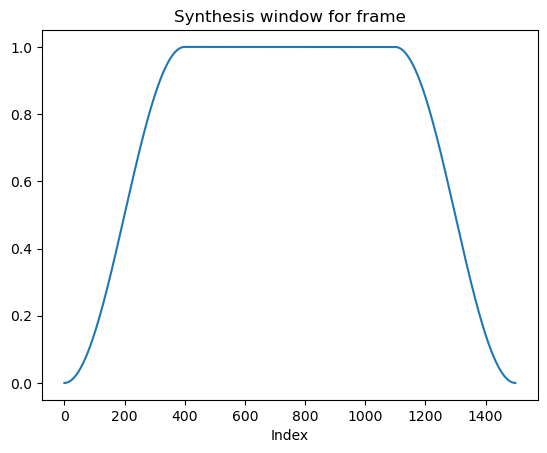

In [6]:
# Synthesis window for overlap
st_window = np.ones(w_len)

# half Hann sides
st_window[:int(overlap*w_len)] = hann(int(2*overlap*w_len))[:int(overlap*w_len)]
st_window[-int(overlap*w_len):] = hann(int(2*overlap*w_len))[-int(overlap*w_len):]

plt.plot(st_window)
plt.xlabel("Index")
plt.title("Synthesis window for frame")
plt.show()

#### Definition of the pitch correction function
All the other function used are implemented in the methods.py file.

In [7]:
def pitch_corrector(x, w_len, hop, st_window, key, delta, yin_tol, valley, f_s, f_min, f_max):
    # Arrays inits
    out = np.zeros_like(x, dtype=np.float64)
    yin_temp = np.zeros(tau_max, dtype=np.float64)
    pitch_arr = np.zeros((x.shape[0]-w_len)//hop+1, dtype=np.float64)
    out_window = np.zeros(w_len, dtype=np.float64)


    # Previous value inits
    prev_pitch = 5.0
    prev_voiced_pitch = 5.0
    prev_an_marks = np.array([])
    prev_st_marks = np.array([])

    k = 0
    # Start of the processing
    for i in range(tau_max, x.shape[0] - w_len, hop):
        # Get frame of current index
        x_frame = x[i: i+w_len]

        # Get pitch
        pitch = yin_algo(x, i, yin_temp, w_len, f_s, f_min, f_max, yin_tol)
        pitch_arr[k] = pitch

        # Get closest note, compute beta ...

        # if the current frame is voiced
        if pitch > 10:
            note_idx = np.argmin(np.abs(pitch-notes_freq))
            target_freq = notes_freq[note_idx]
            target_note_str = notes_str[note_idx]
            beta = target_freq/pitch

        # if a previous frame has been voiced
        elif prev_voiced_pitch > 10:
            note_idx = np.argmin(np.abs(prev_voiced_pitch - notes_freq))
            target_freq = notes_freq[note_idx]
            target_note_str = notes_str[note_idx]
            beta = target_freq / prev_voiced_pitch

        # if its the beginning of the processing
        else:
            beta = 1

        # Get analysis pitch marks
        if k > 0:
            prev_an_marks = np.copy(an_marks)
            prev_pitch = pitch_arr[k-1]
            if prev_pitch > 10:
                prev_voiced_pitch = prev_pitch

        an_marks = pitch_marks(x_frame, pitch, prev_an_marks, prev_pitch, prev_voiced_pitch,
                                    w_len, hop, f_s, delta, valley)

        # Place synthesis pitch marks
        st_marks = synthesis_pitch_marks(pitch, prev_pitch, prev_voiced_pitch, an_marks, prev_st_marks, beta,
                         w_len, hop, f_s)

        # LPC, get coefficients and then prediction error
        a = lpc(x_frame, p)

        # Filter also some samples outside the window, because can be needed 
        e = sp.lfilter(a, [1], x[i - tau_max: i + w_len])

        # Clear out_window
        out_window = out_window * 0.0

        # Psola algorithm on residual e
        out_window = pitch_shift(e, out_window, pitch, prev_voiced_pitch, an_marks, st_marks, beta, w_len, f_s, 
                                 tau_max)

        prev_st_marks = st_marks

        # IIR filtering to get back real sound and add windowed frame to full output array
        out[i: i+w_len] = out[i: i+w_len] + sp.lfilter([1], a, out_window) * st_window

        k = k + 1
        
    return out, pitch_arr

#### Correction of an in tune sample
Let's pitch correct Freddy Mercury's voice (even if he's obviously singing in tune !)

In [8]:
out_1, pitch_array = pitch_corrector(x_1, w_len, hop, st_window, key, delta, yin_tol, valley, f_s, f_min, f_max)

Let's hear how it sounds

In [9]:
IPython.display.Audio(out_1, rate = f_s)

As pointed in the report, this pitch shifting algorithm corrects the voice too quickly ! This makes the transition between notes too abrupt and cancel the voice vibrato. But thanks to this, Freddy could easily be in today's music chart ! 

#### Correction of an out of tune sample
In order to see if the pitch correction really works, let's try it on a voice that really needs pitch correction ! As I quite like this "Don't stop me now" sound sample, I detuned it to make it artificially sounds bad. 

Here is how it sounds ! (sorry about that ...)

In [10]:
# Read wave file
name = "SoundSamples/queen_F_detuned"
wavefile_name = name + '.wav'
wav_obj = wavio.read(wavefile_name)
x_detuned = wav_obj.data[:, 0]
# get double between -1 and 1
x_detuned = np.array(x_detuned, dtype=np.float64)/32767.0

# Sampling frequency of audio signal in Hz
f_s = wav_obj.rate

IPython.display.Audio(x_detuned, rate = f_s)

Let's urgently correct this !

In [11]:
out_detuned, pitch_array = pitch_corrector(x_detuned, w_len, hop, st_window, key, delta, yin_tol, valley, f_s, f_min, f_max)

Here is how the corrected sample sounds

In [12]:
IPython.display.Audio(out_detuned, rate = f_s)

The voice is sucessfully corrected ! But the correction is quite unstable. The target note often oscillates between two notes in the key. This implementation is too sensible to vibrato in the voice and struggles to find the correct closest note in a stable way ! A fix for this could be to implement a tool that allows to choose the target pitch in post production !